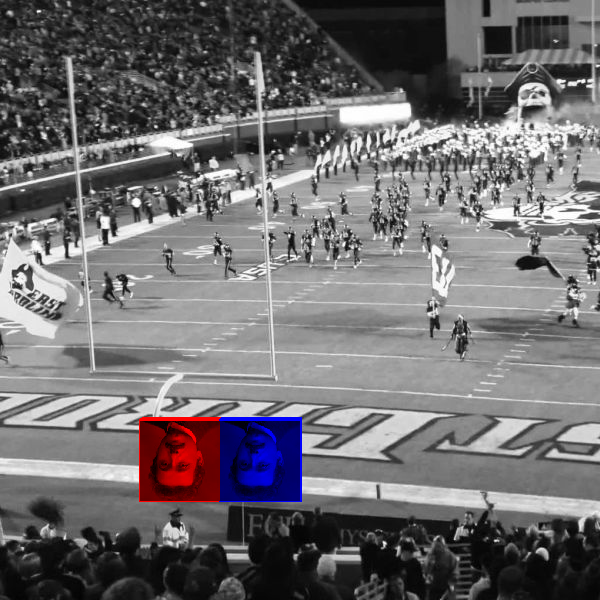

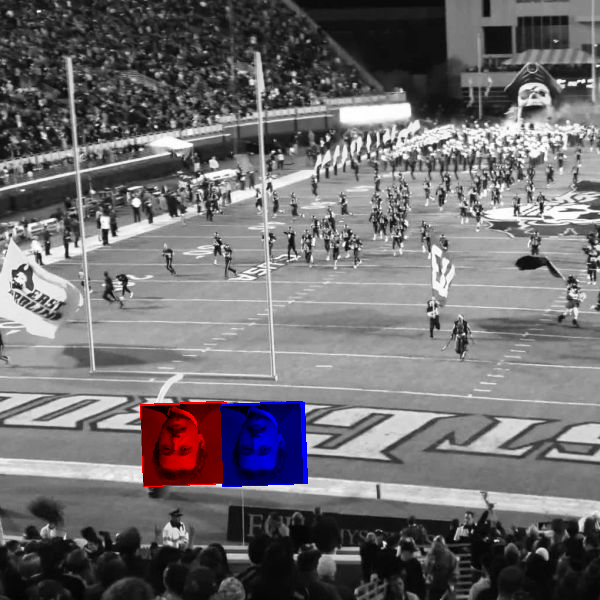

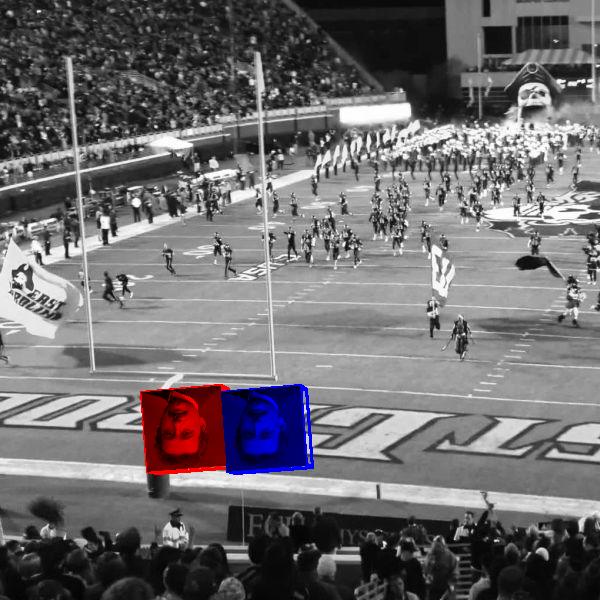

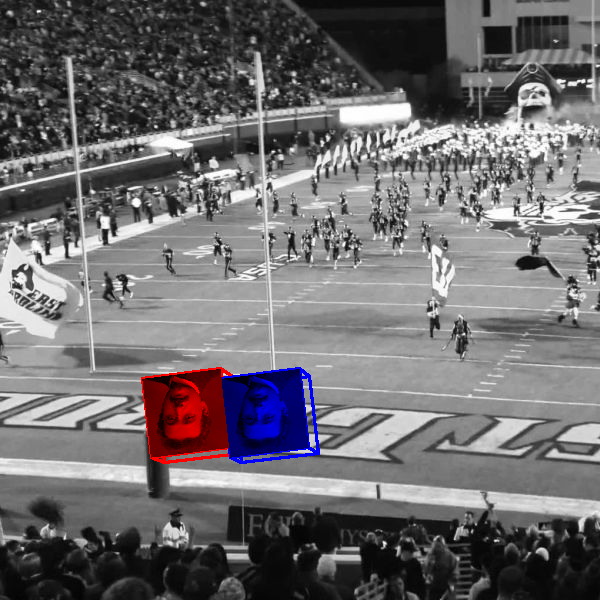

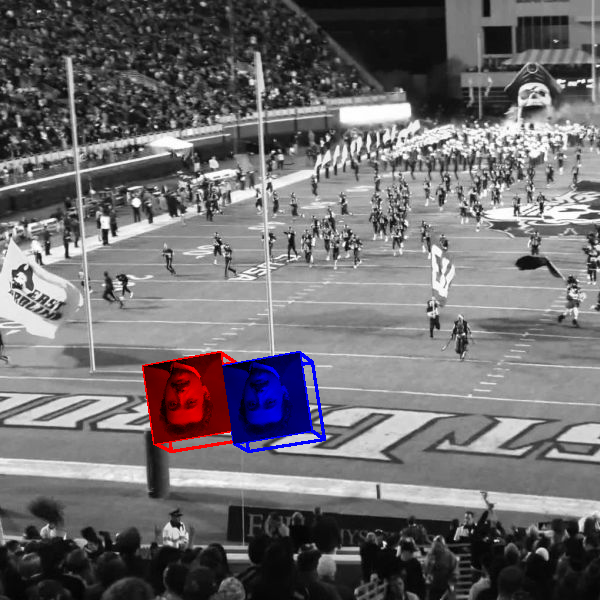

...

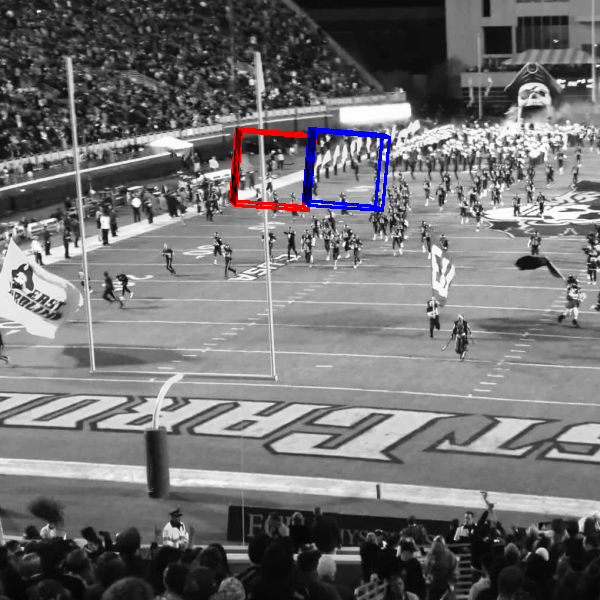

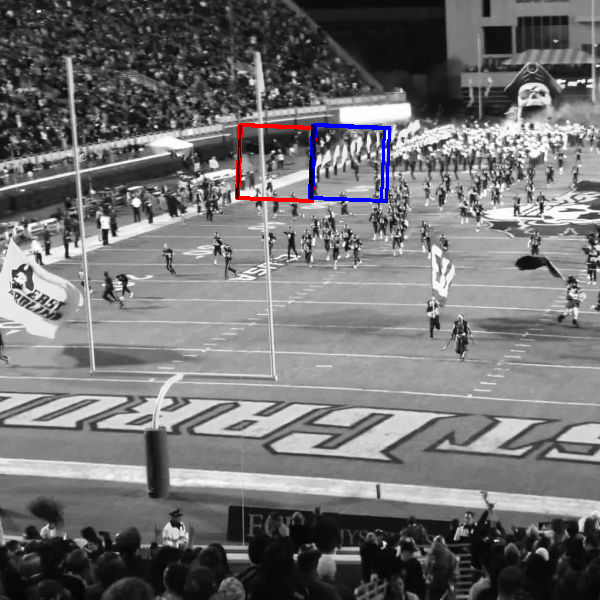

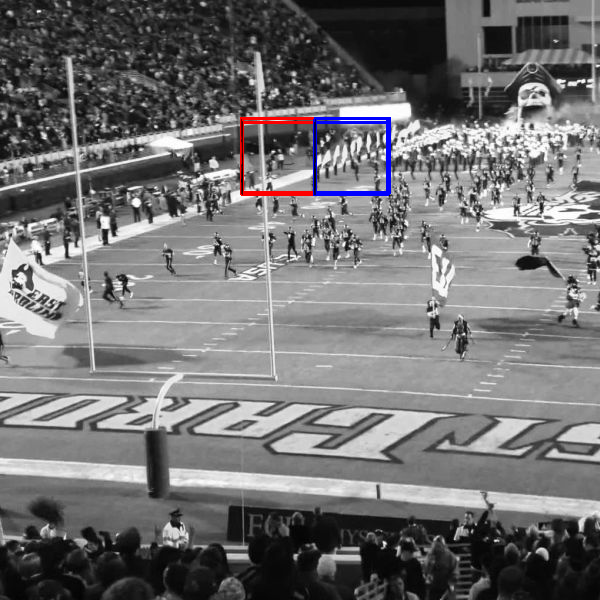

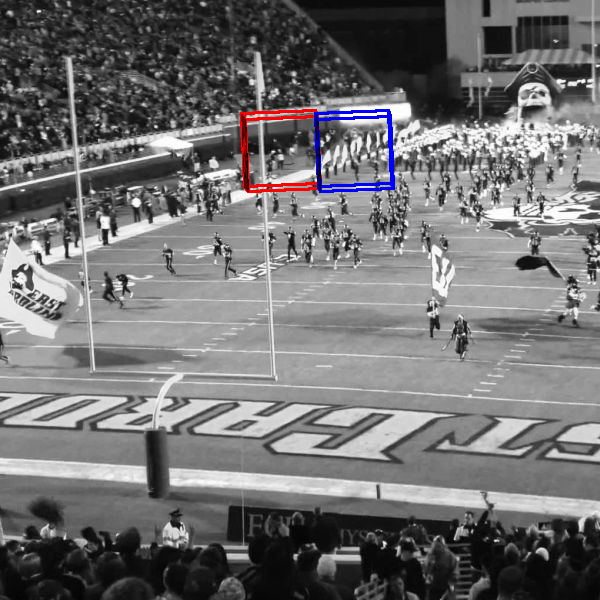

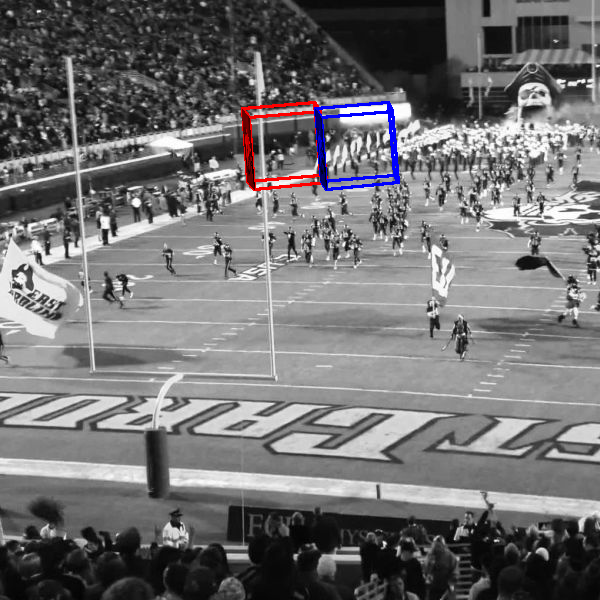

In [ ]:
"""
Taharina Tasnim
115613595

ESE 568 Project 2
Original Matlab project by: M. Subbarao, ECE, SBU
Python Template : Revised by TA C. Orlassino (8/31/2022)

Stable version: python 3.8

Don't touch the import statements. The template uses numpy and cv2.

Installing necessary packages:
* Many IDEs will prompt you to install automatically on a failed import
* If not, run from console in this directory: "pip install opencv-python"
* Try "pip3" or "py -m pip" if "pip" doesn't work for you
* ^This depends on your environment variables set when you installed python

More info on necessary packages:
cv2 package: https://pypi.org/project/opencv-python/
numpy package: https://numpy.org/install/
"""

import sys
import numpy as np
import cv2
from google.colab.patches import cv2_imshow



# function for rotation and translation, map Vi = (X, Y, Z) to v = (x, y)

def Map2Da(K, R, T, Vi):
    T_transpose = np.transpose(np.atleast_2d(T))        # numpy needs to treat 1D as 2D to transpose
    V_transpose = np.transpose(np.atleast_2d(np.append(Vi,[1])))
    RandTappended = np.append(R, T_transpose, axis=1)
    P = K @ RandTappended @ V_transpose       # @ = matrix mult operator
    P = np.asarray(P).flatten()       # flat array

    w1 = P[2]
    v = [None]*2
    v[0]= P[0] / w1
    v[1]= P[1] / w1

    return v


'''
function for mapping image coordinates in mm to
row and column index of the image, with pixel size p mm and
image center at [r0,c0]

u : the 2D point in mm space
[r0, c0] : the image center
p : pixel size in mm

@return : the 2D point in pixel space
'''

def MapIndex(u, c0, r0, p):
    v = [None]*2
    v[0] = round(r0 - u[1] / p)
    v[1] = round(c0 + u[0] / p)
    return v


'''
Wrapper for drawing line cv2 draw line function
Necessary to flip the coordinates b/c of how Python indexes pixels on the screen >:(

A : matrix to draw a line in
vertex1 : terminal point for the line
vertex2 : other terminal point for the line
thickness : thickness of the line(default = 3)
color : RGB tuple for the line to be drawn in (default = (255, 255, 255) ie white)

@return : the matrix with the line drawn in it

NOTE: order of vertex1 and vertex2 does not change the line drawn
'''


def drawLine(A,vertex1, vertex2, color = (255, 255, 255), thickness=3):
    v1 = list(reversed(vertex1))
    v2 = list(reversed(vertex2))
    x1, y1 = v1
    x2, y2 = v2
    dx = abs(x2 - x1)
    dy = abs(y2 - y1)

    if x1 < x2:
        sx = 1
    else:
        sx = -1

    if y1 < y2:
        sy = 1
    else:
        sy = -1

    err = dx - dy
    thick_half = thickness // 2

    while True:
        for i in range(-thick_half, thick_half + 1):
            for j in range(-thick_half, thick_half + 1):
                A[y1 + i, x1 + j] = color

        if x1 == x2 and y1 == y2:
            break

        e2 = 2 * err
        if e2 > -dy:
            err -= dy
            x1 += sx
        if e2 < dx:
            err += dx
            y1 += sy

    return A



def main():
    length = 10 #length of an edge in mm
    #the 8 3D points of the cube in mm:
    V1 = np.array([0, 0, 0])
    V2 = np.array([0, length, 0])
    V3 = np.array([length, length, 0])
    V4 = np.array([length, 0, 0])
    V5 = np.array([length, 0, length])
    V6 = np.array([0, length, length])
    V7 = np.array([0, 0, length])
    V8 = np.array([length, length, length])

    '''
    Find the unit vector u81 (N0) corresponding to the axis of rotation which is along (V8-V1).
    From u81, compute the 3x3 matrix N in Eq. 2.32 used for computing the rotation matrix R in eq. 2.34
    '''

    '''
    MISSING: the axis of rotation is to be u81, the unit vector which is (V8-V1)/|(V8-V1)|.
    Calculate u81 here and use it to construct 3x3 matrix N used later to compute rotation matrix R
    Matrix N is described in Eq. 2.32, matrix R is described in Eq. 2.34
    '''
    N0 = V8 - V1
    u81 = N0 / np.linalg.norm(N0)

    N = np.array([[0, -u81[2], u81[1]], [u81[2], 0, -u81[0]], [-u81[1], u81[0], 0]])

    #Initialized given values (do not change unless you're testing something):
    T0 = np.array([-20, -25, 500])  # origin of object coordinate system in mm
    U0 = np.array([-10, -25, 500])
    f = 40  # focal length in mm
    velocity = np.array([2, 9, 7])  # translational velocity
    acc = np.array([0.0, -0.80, 0])  # acceleration
    theta0 = 0 #initial angle of rotation is 0 (in degrees)
    w0 = 20  # angular velocity in deg/sec
    p = 0.01  # pixel size(mm)
    Rows = 600  # image size
    Cols = 600  # image size
    r0 = np.round(Rows / 2) #x-value of center of image
    c0 = np.round(Cols / 2) #y-value of center of image
    time_range = np.arange(0.0, 24.2, 0.2)

    K = np.array([[f, 0, 0], [0, f, 0], [0, 0, 1]])


    # This section handles mapping the texture to one face:

    # You are given a face of a cube in 3D space specified by its
    # corners at 3D position vectors V1, V2, V3, V4.
    # You are also given a square graylevel image tmap of size r x c
    # This image is to be "painted" on the face of the cube:
    # for each pixel at position (i,j) of tmap,
    # the corresponding 3D coordinates
    # X(i,j), Y(i,j), and Z(i,j), should be computed,
    # and that 3D point is
    # associated with the brightness given by tmap(i,j).
    #
    # MISSING:
    # Find h, w: the height and width of the face
    # Find the unit vectors u21 and u41 which coorespond to (V2-V1) and (V4-V1)
    # hint: u21 = (V2-V1) / h ; u41 = (V4 - V1) / w

    h = np.sqrt(np.linalg.norm(V2 - V1))
    w = np.sqrt(np.linalg.norm(V4 - V1))
    u21 = (V2 - V1) / h
    u41 = (V4 - V1) / w

    # We use u21 and u41 to iteratively discover each point of the face below:
    # Finding the 3D points of the face bounded by V1, V2, V3, V4
    # and associating each point with a color from texture:

    tmap = cv2.imread('/content/drive/MyDrive/Colab Notebooks/assignment2/images/einstein132.jpg')
    background = cv2.imread('/content/drive/MyDrive/Colab Notebooks/assignment2/images/background.jpg')

    if tmap is None or background is None:
        print("image file can not be found on path given. Exiting now")
        sys.exit(1)

    r, c, colors = tmap.shape

    # We keep three arrays of size (r, c) to store the (X, Y, Z) points cooresponding
    # to each pixel on the texture
    X = np.zeros((r, c), dtype=np.float64)
    Y = np.zeros((r, c), dtype=np.float64)
    Z = np.zeros((r, c), dtype=np.float64)
    for i in range(0, r):
        for j in range(0, c):
            p1 = V1 + (i) * u21 * (h / r) + (j) * u41 * (w / c)
            X[i, j] = p1[0]
            Y[i, j] = p1[1]
            Z[i, j] = p1[2]


    for t in time_range:  # Generate a sequence of images as a function of time
        theta = np.radians(theta0 + w0 * t)
        T = T0 + velocity * t + 0.5 * acc * t * t
        U = U0 + velocity * t + 0.5 * acc * t * t
        R = np.eye(3) + np.sin(theta) * N + (1 - np.cos(theta)) * N @ N

        # image positions of vertices

        v = Map2Da(K, R, T, V1)
        v1 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, T, V2)
        v2 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, T, V3)
        v3 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, T, V4)
        v4 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, T, V5)
        v5 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, T, V6)
        v6 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, T, V7)
        v7 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, T, V8)
        v8 = MapIndex(v, c0, r0, p)

        v = Map2Da(K, R, U, V1)
        v11 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, U, V2)
        v21 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, U, V3)
        v31 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, U, V4)
        v41 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, U, V5)
        v51 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, U, V6)
        v61 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, U, V7)
        v71 = MapIndex(v, c0, r0, p)
        v = Map2Da(K, R, U, V8)
        v81 = MapIndex(v, c0, r0, p)


        colorRed = (0, 0, 255) #note, CV uses BGR by default, not gray=(R+G+B)/3. This is Red.
        colorBlue = (255, 0, 0) #note, CV uses BGR by default, not gray=(R+G+B)/3. This is Red.
        thickness = 2


        A = np.zeros((Rows, Cols, 3), dtype=np.uint8) #array stores the image at this time step; (Rows x Cols) pixels, 3 channels per pixel
        A = background.copy()
        A = drawLine(A, v1, v2, colorRed, thickness)
        A = drawLine(A, v2, v3, colorRed, thickness)
        A = drawLine(A, v3, v4, colorRed, thickness)
        A = drawLine(A, v4, v1, colorRed, thickness)
        A = drawLine(A, v7, v6, colorRed, thickness)
        A = drawLine(A, v6, v8, colorRed, thickness)
        A = drawLine(A, v8, v5, colorRed, thickness)
        A = drawLine(A, v5, v7, colorRed, thickness)
        A = drawLine(A, v1, v7, colorRed, thickness)
        A = drawLine(A, v2, v6, colorRed, thickness)
        A = drawLine(A, v3, v8, colorRed, thickness)
        A = drawLine(A, v4, v5, colorRed, thickness)

        A = drawLine(A, v11, v21, colorBlue, thickness)
        A = drawLine(A, v21, v31, colorBlue, thickness)
        A = drawLine(A, v31, v41, colorBlue, thickness)
        A = drawLine(A, v41, v11, colorBlue, thickness)
        A = drawLine(A, v71, v61, colorBlue, thickness)
        A = drawLine(A, v61, v81, colorBlue, thickness)
        A = drawLine(A, v81, v51, colorBlue, thickness)
        A = drawLine(A, v51, v71, colorBlue, thickness)
        A = drawLine(A, v11, v71, colorBlue, thickness)
        A = drawLine(A, v21, v61, colorBlue, thickness)
        A = drawLine(A, v31, v81, colorBlue, thickness)
        A = drawLine(A, v41, v51, colorBlue, thickness)


        # Now we must add the texture to the face bounded by v1-4:
        for i in range(r):
            for j in range(c):
                p1 = [X[i, j], Y[i, j], Z[i, j]]        # p1 stores the world point on the cubic face, corresponds to (i, j) on the texture
                v = Map2Da(K, R, T, p1)
                v1 = MapIndex(v, c0, r0, p)
                ir, jr = int(v1[0]), int(v1[1])

                v = Map2Da(K, R, U, p1)
                v11 = MapIndex(v, c0, r0, p)
                ir1, jr1 = int(v11[0]), int(v11[1])

                if ((ir >= 0) and (jr >= 0) and (ir < Rows) and (jr < Cols)):
                    tmapval = tmap[i, j, 2]
                    A[ir ,jr] = [ 0, 0, tmapval ]

                if ((ir1 >= 0) and (jr1 >= 0) and (ir1 < Rows) and (jr1 < Cols)):
                    tmapval = tmap[i, j, 2]
                    A[ir1 ,jr1] = [ tmapval, 0, 0 ]


        cv2_imshow(A)

        #cv2.waitKey(0)
        # ^^^ uncomment if you want to display frame by frame
        # and press return(or any other key) to display the next frame
        #by default just waits 1 ms and goes to next frame
        cv2.waitKey(1)


if __name__ == "__main__":
    main()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
